In [1]:
#Import packages
import os
import glob
import json
import pickle
#from tqdm import tqdm

import nilearn
import nibabel as nib
from nibabel import load
from nibabel.gifti import GiftiDataArray, GiftiImage

from nilearn import image as nimg
from nilearn import plotting as nplot
from nilearn.glm.first_level import FirstLevelModel, make_first_level_design_matrix, run_glm
from nilearn.glm.second_level import make_second_level_design_matrix, SecondLevelModel
from nilearn.glm import fdr_threshold,threshold_stats_img
from nilearn.glm.contrasts import compute_contrast, compute_fixed_effects

from bids.layout import BIDSLayout, parse_file_entities

# import cortex
# from cortex import fmriprep

from nipype.interfaces.workbench.base import WBCommand
from nipype.algorithms import modelgen
from nipype.interfaces.base import Bunch

import scipy.stats as stats

from statsmodels.api import OLS

import hcp_utils as hcp

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
%matplotlib inline
#! module load openmind/hcp-workbench/1.2.3

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


In [17]:
# with open("second_level_effects_wos_qc", "rb") as fp:   # Unpickling
#     second_level_effects = pickle.load(fp)

In [11]:
task_list = ['nwr','emosent']
second_level_effects = {task: glob.glob(f'../../derivatives/second_level_110123/*{task}*effect_size*') 
                        for task in task_list}

effect_size_signals_combined = {}
for task, fx in second_level_effects.items():
    effect_size_signals = [nimg.load_img(file).get_fdata(dtype='f4') for file in fx]
    effect_size_signals_combined[task] = np.vstack(effect_size_signals)

In [12]:
#loading my covariates and putting into the second level design matrix

#task_list = ['pataka', 'emosent', 'vowel', 'nwr']


pheno = pd.read_csv('bdi_scores.csv', index_col=0)[['voice_id','beckdepressionii_total','age', 'sex']].reset_index(drop=True)

#955 is a duplicate but from the audio i determined it is a young female not an old man
#removing the old man from the phenotype list
pheno = pheno[~((pheno.voice_id == 955) & (pheno.age == 53) & (pheno.sex == 1))]

#de-mean BDI total score and age
pheno.beckdepressionii_total = pheno.beckdepressionii_total - pheno.beckdepressionii_total.mean()
pheno.age = pheno.age - pheno.age.mean() # so I demeaned everything for now...

#create per-task list of subjects
# sub_list = {task: 
#             [int(file.split('sub-voice')[1].split('_ses')[0])for file in fx] 
#             for task, fx in second_level_effects.items() }
#pheno = pheno[pheno.voice_id.isin(sub_list)]
#sub_info = pheno.rename(columns={'voice_id':'subject_label'})

In [56]:
task_design_matrix = {}
for task, fx in second_level_effects.items():
    pheno_per_ses = []
    for file in fx:
        info = parse_file_entities(file)
        sub = int(info['subject'].split('voice')[1])
        demo = pheno[pheno.voice_id == sub]
        demo.loc[:,'voice_id'] = str(sub) + '_ses-' + info['session'] + '_task-' + info['task']
        if task == 'nwr':
            demo.loc[:,'nwr'] = 1
            demo.loc[:, 'emosent'] = 0
        elif task == 'emosent':
            demo.loc[:, 'nwr'] = 0
            demo.loc[:,'emosent'] = 1
        pheno_per_ses.append(demo)

    design_matrix = pd.concat(pheno_per_ses)
    design_matrix.index = design_matrix.voice_id
    design_matrix = design_matrix.drop('voice_id', axis=1)
    intercept = pd.Series(np.ones(design_matrix.shape[0]), name='intercept',
                                  index=design_matrix.index)
    design_matrix = pd.concat([design_matrix, intercept], axis = 1)
    design_matrix = design_matrix
    task_design_matrix[task] = design_matrix
task_condition_design_matrix = pd.concat([task_design_matrix['nwr'], task_design_matrix['emosent']])

/tmp/ipykernel_32025/2534946800.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  demo.loc[:,'nwr'] = 1
/tmp/ipykernel_32025/2534946800.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  demo.loc[:, 'emosent'] = 0
/tmp/ipykernel_32025/2534946800.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.ht

/tmp/ipykernel_32025/2534946800.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  demo.loc[:,'nwr'] = 1
/tmp/ipykernel_32025/2534946800.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  demo.loc[:, 'emosent'] = 0
/tmp/ipykernel_32025/2534946800.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.ht

/tmp/ipykernel_32025/2534946800.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  demo.loc[:, 'nwr'] = 0
/tmp/ipykernel_32025/2534946800.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  demo.loc[:,'emosent'] = 1
/tmp/ipykernel_32025/2534946800.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.ht

In [44]:
task_condition_design_matrix.columns

Index(['beckdepressionii_total', 'age', 'sex', 'nwr', 'emosent', 'intercept'], dtype='object')

In [58]:
def create_group_contrast(design_matrix, covariate):
    contrast = np.zeros(design_matrix.shape[1])
    cov_index = design_matrix.columns.get_loc(covariate)
    contrast[cov_index] = 1
    return contrast

In [60]:
def create_task_difference_contrast(design_matrix):
    contrast = np.zeros(design_matrix.shape[1])
    cov_index_nwr = design_matrix.columns.get_loc('nwr')
    contrast[cov_index_nwr] = 1
    
    cov_index_emosent = design_matrix.columns.get_loc('emosent')
    contrast[cov_index_emosent] = -1
    return contrast

In [50]:
effect_size_all = np.vstack([effect_size_signals_combined['nwr'], effect_size_signals_combined['emosent']])

In [64]:
model_out = {}

covariate_list = ['age', 'sex','nwr', 'emosent','intercept']
labels, estimates = run_glm(effect_size_all, task_condition_design_matrix[covariate_list].values, noise_model='ols', 
                            n_jobs=-2, verbose=0)
contrast = create_task_difference_contrast(task_condition_design_matrix[covariate_list])
contrast_out = compute_contrast(labels, estimates, contrast, contrast_type='t')
model_out = contrast_out
#model_out[condition] = betas
model_out

In [68]:
task_condition_design_matrix[covariate_list]

,age,sex,nwr,emosent,intercept
voice_id,,,,,
844_ses-1_task-nwr,-8.033898,1.0,1,0,1.0
846_ses-1_task-nwr,-9.033898,0.0,1,0,1.0
849_ses-1_task-nwr,-13.033898,1.0,1,0,1.0
850_ses-1_task-nwr,-3.033898,0.0,1,0,1.0
856_ses-1_task-nwr,-8.033898,1.0,1,0,1.0
...,...,...,...,...,...
979_ses-1_task-emosent,0.966102,1.0,0,1,1.0
980_ses-1_task-emosent,-6.033898,1.0,0,1,1.0
981_ses-1_task-emosent,-5.033898,1.0,0,1,1.0


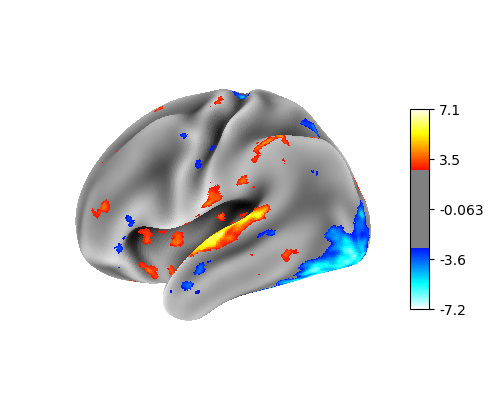

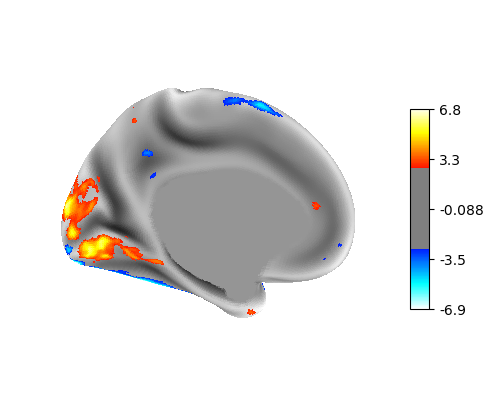

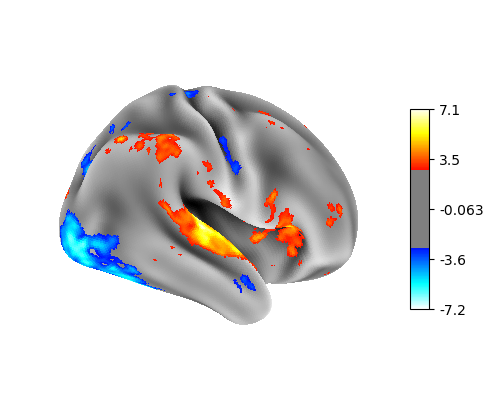

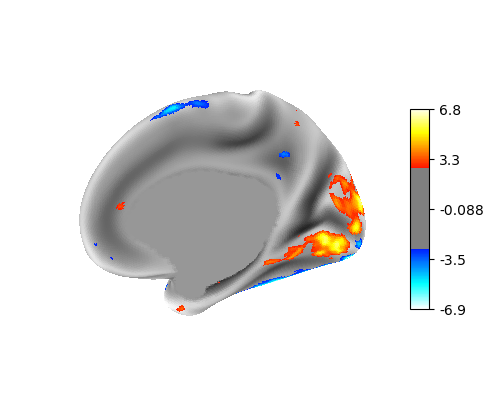

In [67]:
threshold = fdr_threshold(model_out.z_score(), alpha= 0.05)
nplot.plot_surf_stat_map(
    hcp.mesh.inflated, hcp.cortex_data(model_out.z_score()), hemi='left', 
    threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,
    #title = f'{condition} model:{task}, N={n_sub}. LH, w.r.t. {cov}',
    title_font_size=30,#vmax = vmax_per_cov[covariate],
    bg_map=hcp.mesh.sulc)

nplot.plot_surf_stat_map(
    hcp.mesh.inflated_left, hcp.left_cortex_data(model_out.z_score()), view= 'lateral',
    hemi='right', 
    threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,#vmax = vmax_per_cov[covariate],
    bg_map=hcp.mesh.sulc_left)

nplot.plot_surf_stat_map(
    hcp.mesh.inflated, hcp.cortex_data(model_out.z_score()), hemi='right', 
    threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,
    #title = f'{condition} model:{task}, N={n_sub}. RH, w.r.t. {cov}',#vmax = vmax_per_cov[covariate],
    bg_map=hcp.mesh.sulc)

nplot.plot_surf_stat_map(
    hcp.mesh.inflated_right, hcp.left_cortex_data(model_out.z_score()), view= 'lateral',
    hemi='left',
    threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,#vmax = vmax_per_cov[covariate],
    bg_map=hcp.mesh.sulc_right)

nplot.show()

In [61]:
model_out = {}

covariate_list = ['age', 'sex','nwr', 'emosent','intercept']
for cov in covariate_list:
    contrast_out = {}
    for task in task_list: 
        for fx in second_level_effects:
            labels, estimates = run_glm(effect_size_all, task_condition_design_matrix[covariate_list].values, noise_model='ols', 
                                        n_jobs=-2, verbose=0)
            contrast = create_task_difference_contrast(task_condition_design_matrix[covariate_list])
            contrast_out = compute_contrast(labels, estimates, contrast, contrast_type='t')
    model_out[cov] = contrast_out
#model_out[condition] = betas
model_out

{'age': <nilearn.glm.contrasts.Contrast at 0x2b4d608d7dd0>,
 'sex': <nilearn.glm.contrasts.Contrast at 0x2b4d609190d0>,
 'nwr': <nilearn.glm.contrasts.Contrast at 0x2b4d5c061210>,
 'emosent': <nilearn.glm.contrasts.Contrast at 0x2b4d608711d0>,
 'intercept': <nilearn.glm.contrasts.Contrast at 0x2b4d5c25ee10>}

In [66]:
#some subjects have multiple sessions
#so i need to build a design matrix taking this into account

covariate_conds = {'bdi': ['beckdepressionii_total','age', 'sex','intercept'],
                 'no_bdi': ['age', 'sex','intercept']}
cov_design_matrix = {}

for condition, covariate_list in covariate_conds.items():
    task_design_matrix = {}
    for task, fx in second_level_effects.items():
        pheno_per_ses = []
        for file in fx:
            info = parse_file_entities(file)
            sub = int(info['subject'].split('voice')[1])
            demo = pheno[pheno.voice_id == sub]
            demo.loc[:,'voice_id'] = str(sub) + '_ses-' + info['session']
            pheno_per_ses.append(demo)

        design_matrix = pd.concat(pheno_per_ses)
        design_matrix.index = design_matrix.voice_id
        design_matrix = design_matrix.drop('voice_id', axis=1)
        intercept = pd.Series(np.ones(design_matrix.shape[0]), name='intercept',
                                      index=design_matrix.index)
        design_matrix = pd.concat([design_matrix, intercept], axis = 1)
        design_matrix = design_matrix[covariate_list]
        task_design_matrix[task] = design_matrix
    cov_design_matrix[condition] = task_design_matrix


In [69]:
covariate_conds

{'bdi': ['beckdepressionii_total', 'age', 'sex', 'intercept'],
 'no_bdi': ['age', 'sex', 'intercept']}

In [74]:
model_out = {}

for condition, covariate_list in covariate_conds.items():
    betas = {}
    for cov in covariate_list:
        contrast_out = {}
        for task in task_list: 
            for fx in second_level_effects:
                labels, estimates = run_glm(effect_size_signals_combined[task], cov_design_matrix[condition][task].values, noise_model='ols', 
                                            n_jobs=-2, verbose=0)
                contrast = create_group_contrast(cov_design_matrix[condition][task], cov)
                contrast_out[task] = compute_contrast(labels, estimates, contrast, contrast_type='t')
        betas[cov] = contrast_out
    model_out[condition] = betas
model_out

{'bdi': {'beckdepressionii_total': {'nwr': <nilearn.glm.contrasts.Contrast at 0x2b60ccd29fd0>,
   'emosent': <nilearn.glm.contrasts.Contrast at 0x2b60ccc84310>},
  'age': {'nwr': <nilearn.glm.contrasts.Contrast at 0x2b60ccc86190>,
   'emosent': <nilearn.glm.contrasts.Contrast at 0x2b60ccc85150>},
  'sex': {'nwr': <nilearn.glm.contrasts.Contrast at 0x2b60cce85450>,
   'emosent': <nilearn.glm.contrasts.Contrast at 0x2b60cce87e10>},
  'intercept': {'nwr': <nilearn.glm.contrasts.Contrast at 0x2b60cce866d0>,
   'emosent': <nilearn.glm.contrasts.Contrast at 0x2b60cce84510>}},
 'no_bdi': {'age': {'nwr': <nilearn.glm.contrasts.Contrast at 0x2b60cce84b10>,
   'emosent': <nilearn.glm.contrasts.Contrast at 0x2b60cce85090>},
  'sex': {'nwr': <nilearn.glm.contrasts.Contrast at 0x2b60cce85d50>,
   'emosent': <nilearn.glm.contrasts.Contrast at 0x2b60cce87490>},
  'intercept': {'nwr': <nilearn.glm.contrasts.Contrast at 0x2b60cce859d0>,
   'emosent': <nilearn.glm.contrasts.Contrast at 0x2b60cce85490>}}

In [218]:
fdr_threshold(contrast_out.z_score(), alpha=0.05)

2.2444927729368356

In [79]:
model_out['bdi'][cov]

{'nwr': <nilearn.glm.contrasts.Contrast at 0x2b60cce866d0>,
 'emosent': <nilearn.glm.contrasts.Contrast at 0x2b60cce84510>}

60

2.2426455147641464

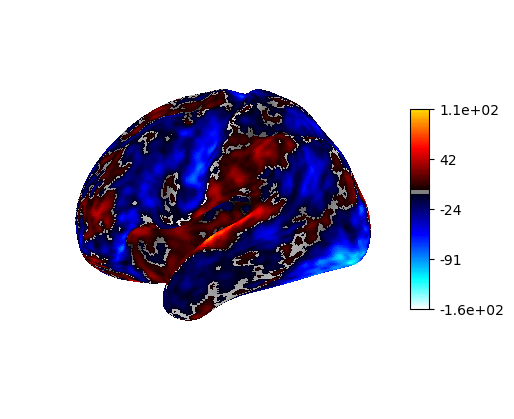

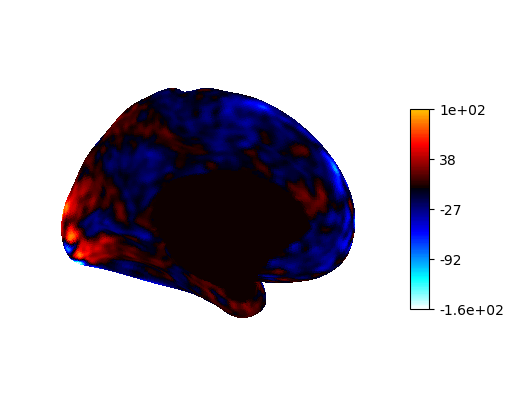

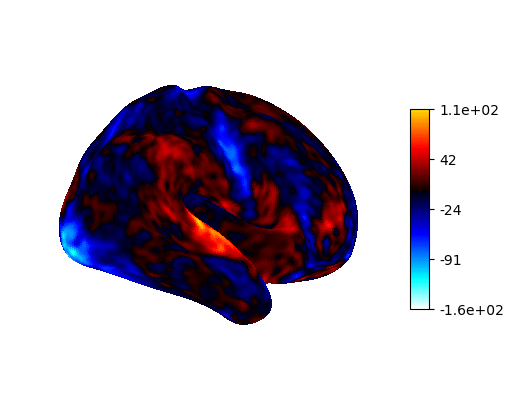

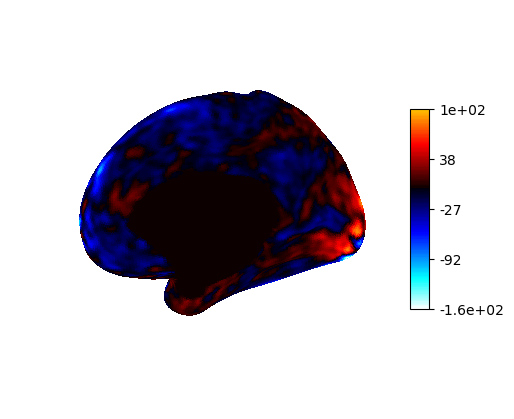

In [98]:
condition = 'bdi'
cov = 'intercept'
nwr_fx = model_out[condition][cov]['nwr'].effect_size()
emosent_fx = model_out[condition][cov]['emosent'].effect_size()
difference = nwr_fx - emosent_fx

nplot.plot_surf_stat_map(
    hcp.mesh.inflated, hcp.cortex_data(difference), hemi='left', 
    threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,
    #title = f'{condition} model:{task}, N={n_sub}. LH, w.r.t. {cov}',
    title_font_size=30,#vmax = vmax_per_cov[covariate],
    bg_map=hcp.mesh.sulc)

nplot.plot_surf_stat_map(
    hcp.mesh.inflated_left, hcp.left_cortex_data(difference), view= 'lateral',
    hemi='right', 
    #threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,#vmax = vmax_per_cov[covariate],
    bg_map=hcp.mesh.sulc_left)

nplot.plot_surf_stat_map(
    hcp.mesh.inflated, hcp.cortex_data(difference), hemi='right', 
    #threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,
    #title = f'{condition} model:{task}, N={n_sub}. RH, w.r.t. {cov}',#vmax = vmax_per_cov[covariate],
    bg_map=hcp.mesh.sulc)

nplot.plot_surf_stat_map(
    hcp.mesh.inflated_right, hcp.left_cortex_data(difference), view= 'lateral',
    hemi='left',
    #threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,#vmax = vmax_per_cov[covariate],
    bg_map=hcp.mesh.sulc_right)

nplot.show()

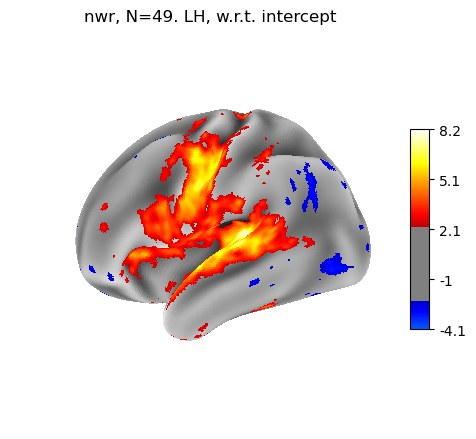

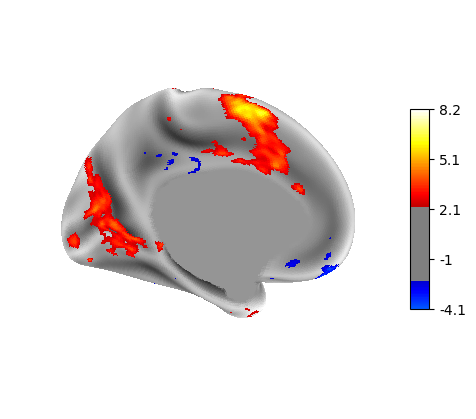

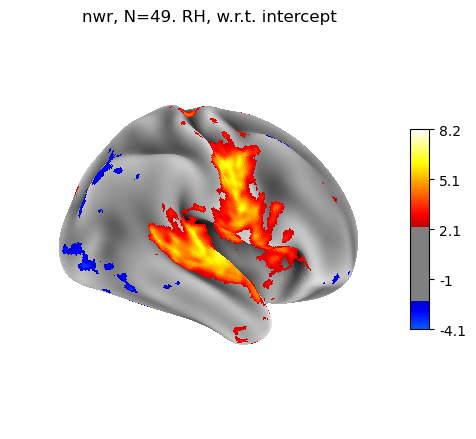

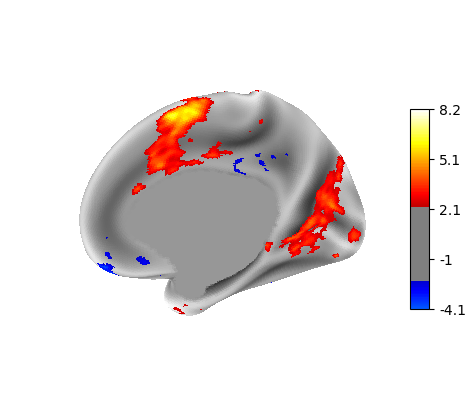

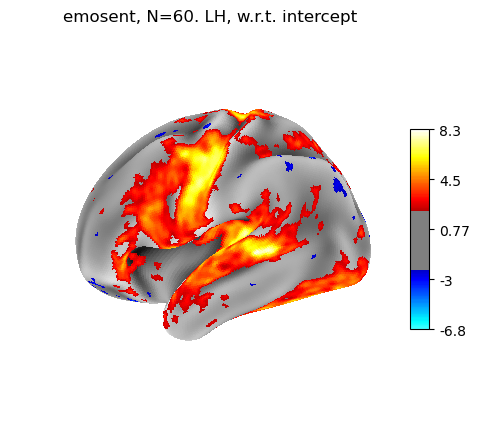

...

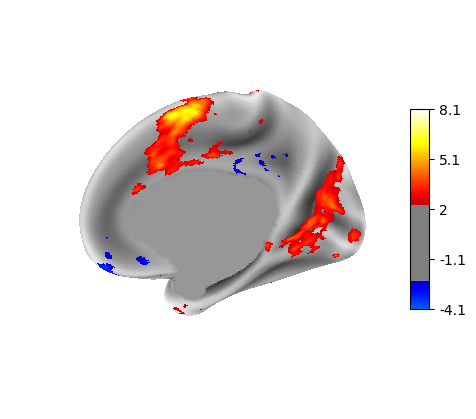

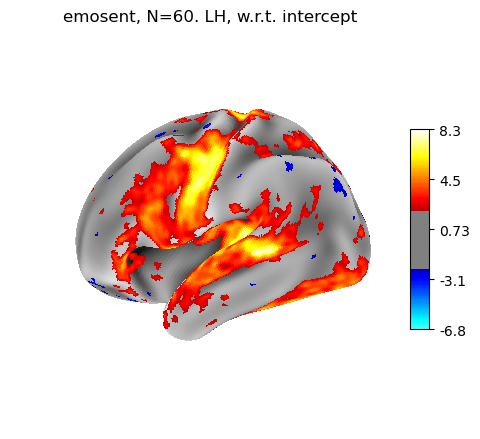

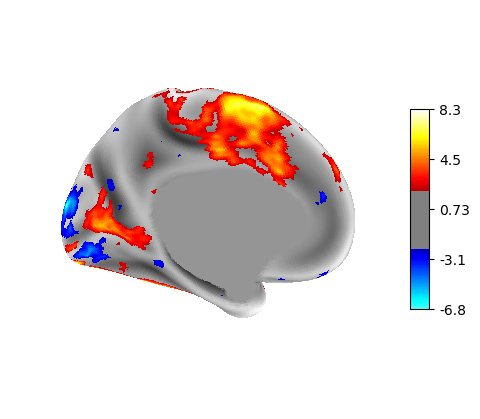

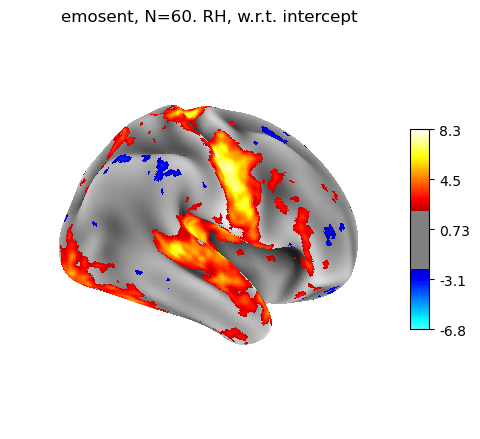

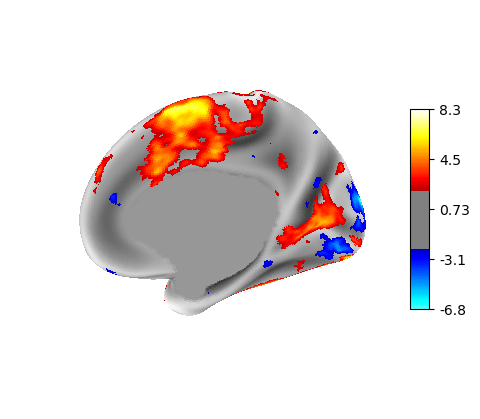

In [91]:
for condition, cond_models in model_out.items():
    cov = 'intercept'
    task_model = cond_models[cov]
    
    for task, contrast_out in task_model.items():
        
        n_sub = cov_design_matrix[condition][task].shape[0]
        threshold= fdr_threshold(contrast_out.z_score(), alpha=0.05)
        
        nplot.plot_surf_stat_map(
            hcp.mesh.inflated, hcp.cortex_data(contrast_out.z_score()), hemi='left', 
            threshold=threshold,
            symmetric_cbar = False,
            colorbar=True,
            title = f'{condition} model:{task}, N={n_sub}. LH, w.r.t. {cov}',
            title_font_size=30,#vmax = vmax_per_cov[covariate],
            bg_map=hcp.mesh.sulc)

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated_left, hcp.left_cortex_data(contrast_out.z_score()), view= 'lateral',
            hemi='right', 
            threshold=threshold,
            symmetric_cbar = False,
            colorbar=True,#vmax = vmax_per_cov[covariate],
            bg_map=hcp.mesh.sulc_left)

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated, hcp.cortex_data(contrast_out.z_score()), hemi='right', 
            threshold=threshold,
            symmetric_cbar = False,
            colorbar=True,
            title = f'{condition} model:{task}, N={n_sub}. RH, w.r.t. {cov}',#vmax = vmax_per_cov[covariate],
            bg_map=hcp.mesh.sulc)

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated_right, hcp.left_cortex_data(contrast_out.z_score()), view= 'lateral',
            hemi='left',
            threshold=threshold,
            symmetric_cbar = False,
            colorbar=True,#vmax = vmax_per_cov[covariate],
            bg_map=hcp.mesh.sulc_right)

        nplot.show()

In [20]:
with open("dict_second_level_betas_wos_qc", "wb") as fp:   #Pickling
    pickle.dump(second_level_betas, fp)

In [3]:
with open("dict_second_level_betas_wos_qc", "rb") as fp:   # Unpickling
    second_level_betas = pickle.load(fp)

In [4]:
second_level_betas_dict = {task: pd.DataFrame(betas) for task, betas in second_level_betas.items()}
betas_z = {task: betas.apply(stats.zscore) for task, betas in second_level_betas_dict.items()}
thresholds = {task: b.apply(lambda z: fdr_threshold(z,alpha=0.05)) for task, b in betas_z.items()}

In [5]:
thresholds['vowel']['intercept']

3.3649277802106825

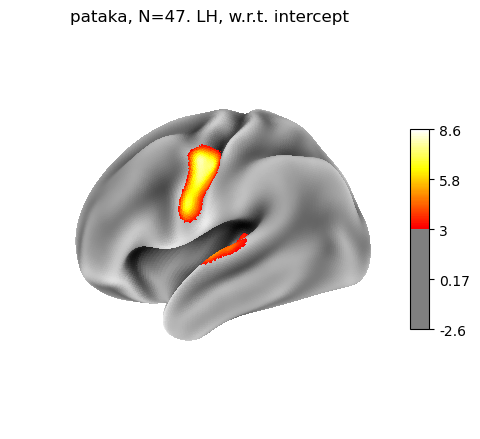

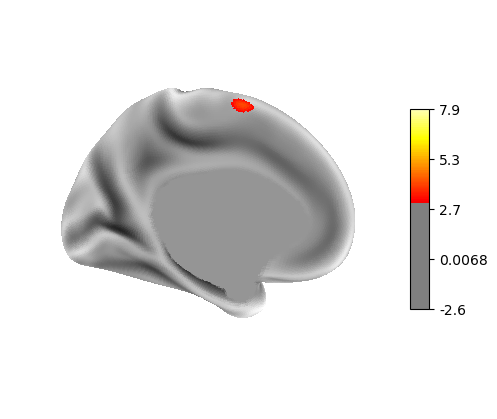

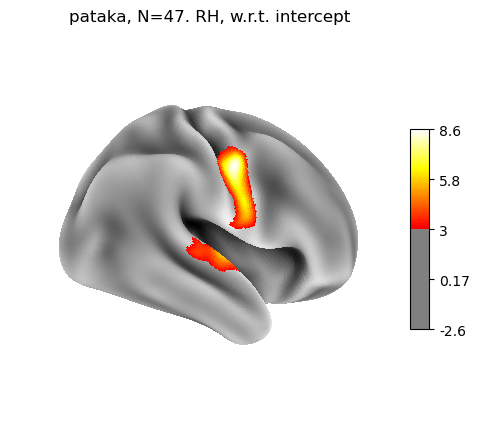

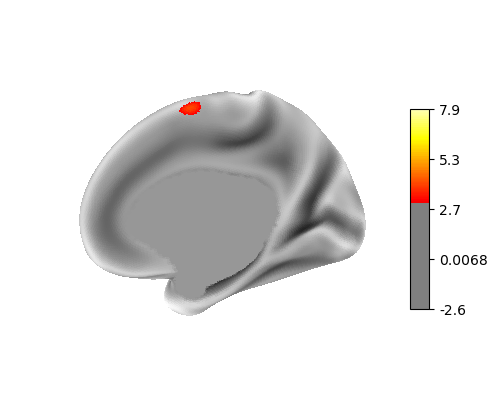

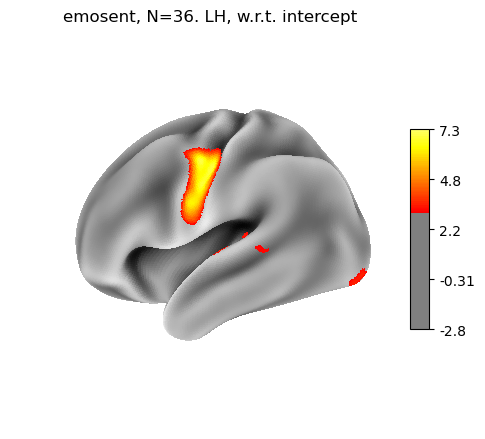

...

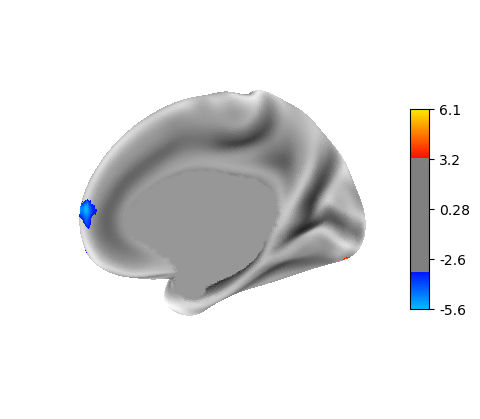

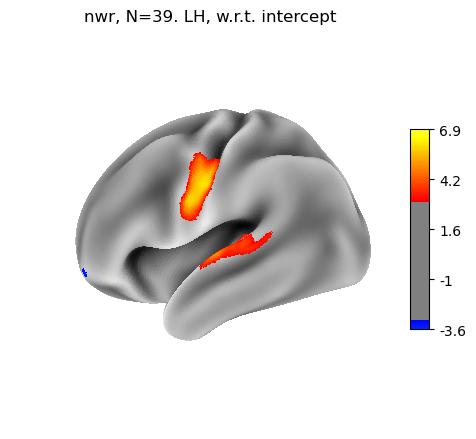

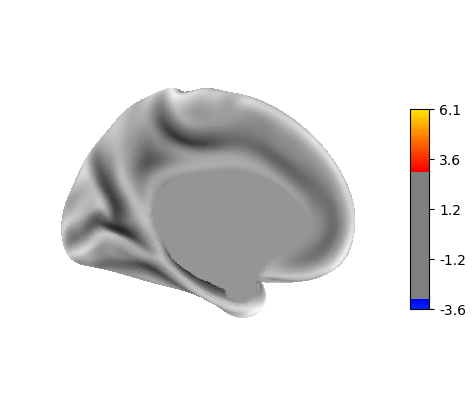

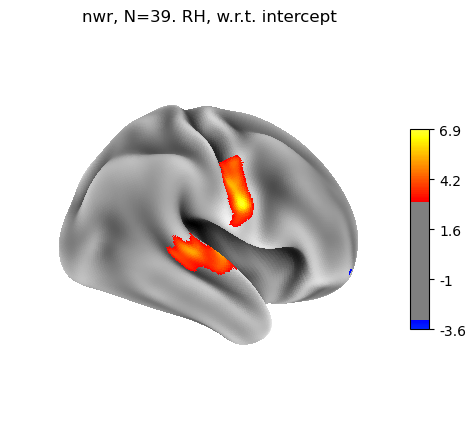

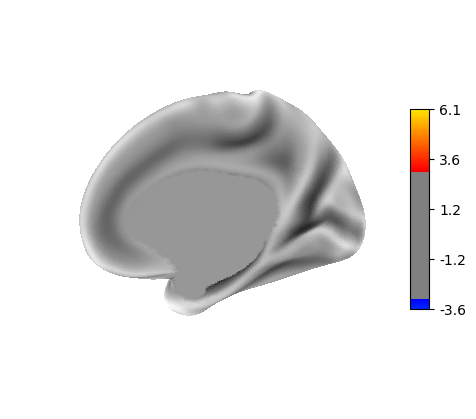

In [21]:
covariate = 'intercept'
vmax_per_cov = pd.DataFrame([b.max() for b in betas_z.values()]).max()

for task, bz in betas_z.items():

    n_sub = len(second_level_effects[task])

    nplot.plot_surf_stat_map(
        hcp.mesh.inflated, hcp.cortex_data(bz[covariate]), hemi='left', threshold=thresholds[task][covariate],
        symmetric_cbar = False,
        colorbar=True,
        title = f'{task}, N={n_sub}. LH, w.r.t. {covariate}',
        title_font_size=30,vmax = vmax_per_cov[covariate],
        bg_map=hcp.mesh.sulc)

    nplot.plot_surf_stat_map(
        hcp.mesh.inflated_left, hcp.left_cortex_data(bz[covariate]), view= 'lateral',
        hemi='right', threshold=thresholds[task][covariate],
        symmetric_cbar = False,
        colorbar=True,vmax = vmax_per_cov[covariate],
        bg_map=hcp.mesh.sulc_left)

    nplot.plot_surf_stat_map(
        hcp.mesh.inflated, hcp.cortex_data(bz[covariate]), hemi='right', threshold=thresholds[task][covariate],
        symmetric_cbar = False,
        colorbar=True,
        title = f'{task}, N={n_sub}. RH, w.r.t. {covariate}',vmax = vmax_per_cov[covariate],
        bg_map=hcp.mesh.sulc)

    nplot.plot_surf_stat_map(
        hcp.mesh.inflated_right, hcp.left_cortex_data(bz[covariate]), view= 'lateral',
        hemi='left', threshold=thresholds[task][covariate],
        symmetric_cbar = False,
        colorbar=True,vmax = vmax_per_cov[covariate],
        bg_map=hcp.mesh.sulc_right)

    nplot.show()


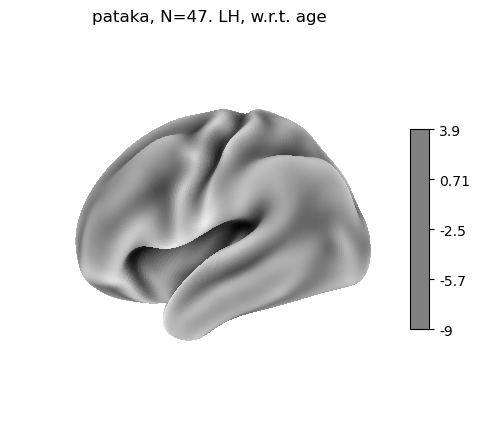

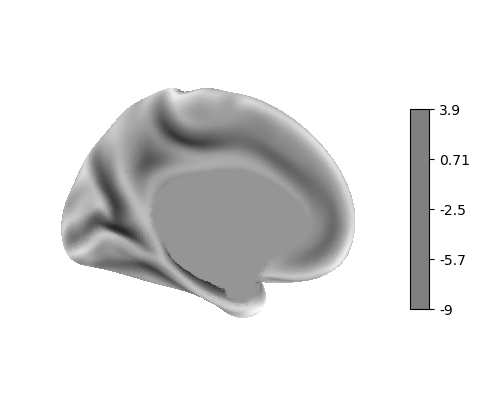

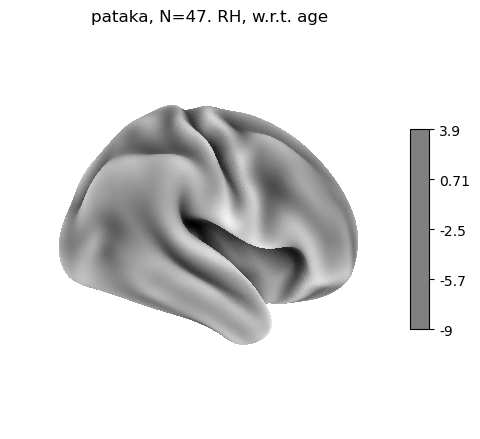

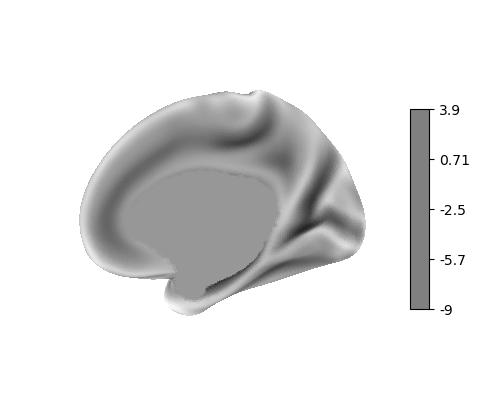

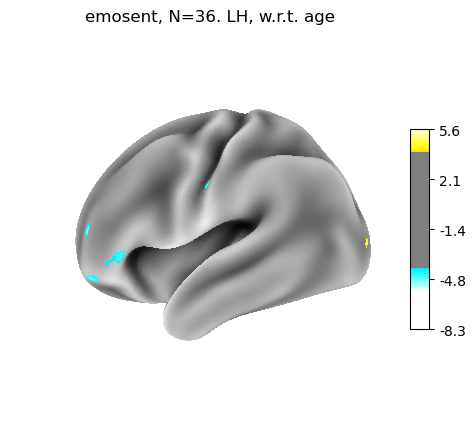

...

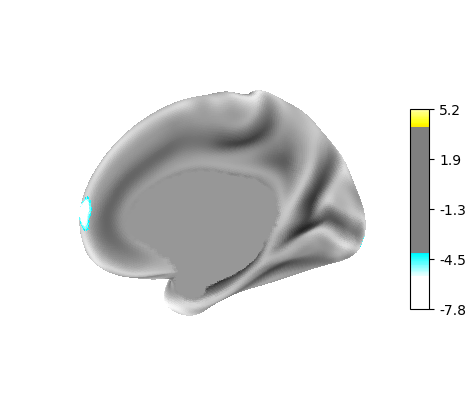

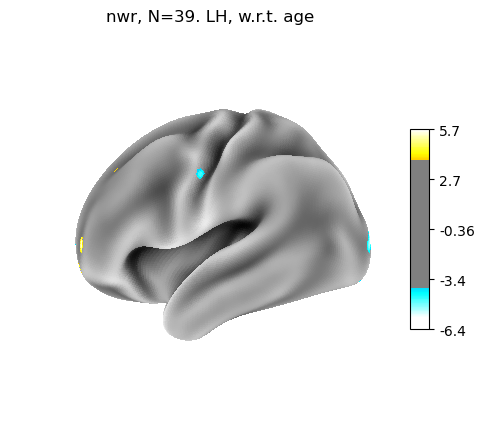

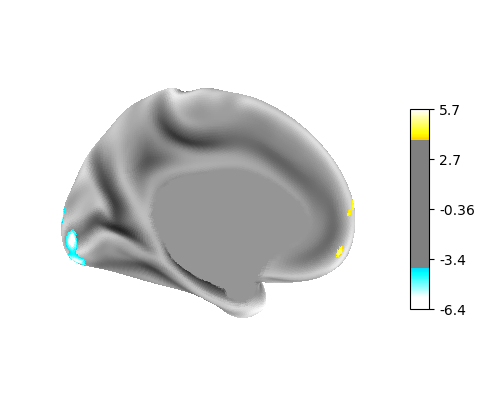

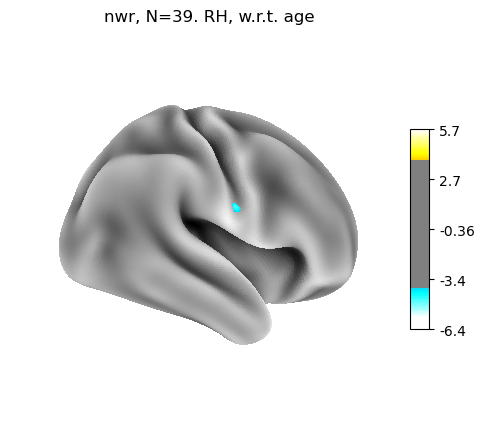

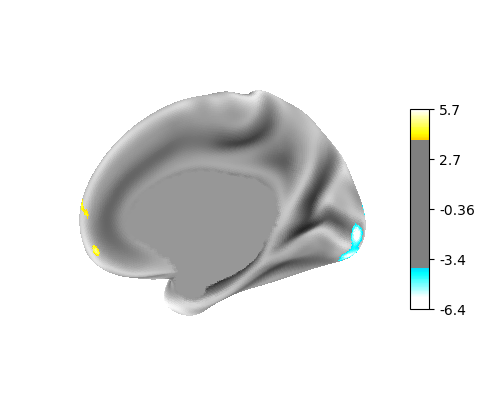

In [23]:
covariate = 'age'

for task, bz in betas_z.items():

    n_sub = len(second_level_effects[task])

    nplot.plot_surf_stat_map(
        hcp.mesh.inflated, hcp.cortex_data(bz[covariate]), hemi='left', threshold=thresholds[task][covariate],
        symmetric_cbar = False,
        colorbar=True,
        title = f'{task}, N={n_sub}. LH, w.r.t. {covariate}',
        title_font_size=30,vmax = vmax_per_cov[covariate],
        bg_map=hcp.mesh.sulc)

    nplot.plot_surf_stat_map(
        hcp.mesh.inflated_left, hcp.left_cortex_data(bz[covariate]), view= 'lateral',
        hemi='right', threshold=thresholds[task][covariate],
        symmetric_cbar = False,
        colorbar=True,vmax = vmax_per_cov[covariate],
        bg_map=hcp.mesh.sulc_left)

    nplot.plot_surf_stat_map(
        hcp.mesh.inflated, hcp.cortex_data(bz[covariate]), hemi='right', threshold=thresholds[task][covariate],
        symmetric_cbar = False,
        colorbar=True,
        title = f'{task}, N={n_sub}. RH, w.r.t. {covariate}',vmax = vmax_per_cov[covariate],
        bg_map=hcp.mesh.sulc)

    nplot.plot_surf_stat_map(
        hcp.mesh.inflated_right, hcp.left_cortex_data(bz[covariate]), view= 'lateral',
        hemi='left', threshold=thresholds[task][covariate],
        symmetric_cbar = False,
        colorbar=True,vmax = vmax_per_cov[covariate],
        bg_map=hcp.mesh.sulc_right)

    nplot.show()


In [3]:
# with open("second_level_effects_FD_sweep", "rb") as fp:   # Unpickling
#     second_level_effects = pickle.load(fp)

second_level_df = pd.DataFrame(second_level_effects)

task_list = list(second_level_df.index)
fd_sweep = list(second_level_df.columns)

fixed_effects = {}

#makes a dict per task/fd of all the runs. Seems redundant but looks nicer than teh PD
for t in task_list:
    fixed_effects[t] = {}
    for fd, fx in second_level_effects.items():        
        fixed_effects[t][fd] = fx[t]


In [4]:
#cope of code which prints out number of runs per task/FD cutoff
pd.DataFrame({t:{fd: len(val) for fd, val in files.items()} for t, files in second_level_effects.items()})

,0.2,0.4,0.6
vowel,6,27,38
nwr,25,47,50
emosent,13,36,47
pataka,5,26,47


In [38]:
#generating second-level betas. Run once and done

#loading my covariates and putting into the second level design matrix
pheno = pd.read_csv('bdi_scores.csv', index_col=0)[['voice_id','age','sex','beckdepressionii_total']].reset_index(drop=True)
pheno = pheno[pheno.voice_id != 955] #exclude this subject

#satra said I should de-mean BDI total score
pheno.beckdepressionii_total = pheno.beckdepressionii_total - pheno.beckdepressionii_total.mean()
pheno.age = pheno.age - pheno.age.mean() # so I demeaned everything for now...

sub_info = pheno.rename(columns={'voice_id':'subject_label'})

second_level_betas = {f:{t: [] for t in task_list} for f in fd_sweep}

# I think this was code to make a design matrix per task/fd combo
for task in task_list:
    for fd in fd_sweep:
        #filter to desired tasks
        #fixed_effects = [f for f in second_level_effects[0.2] if task in f]
        fixed_effects = second_level_df[fd][task]

        #load the data and put into a dataframe
        effect_data = np.squeeze([nib.load(effect).get_fdata(dtype='f4') for effect in fixed_effects])
        Y = pd.DataFrame(effect_data)

        #created the expected inputs for the nilearn function, printed below. Seemed redundant

        if host == 'om':
            sub_list = [int(parse_file_entities(f)['subject'].replace('voice','')) for f in fixed_effects]
        elif host == 'local':
            sub_list = [int(f.split('sub-')[1].split('_ses')[0]) for f in fixed_effects]
        
        second_level_design_matrix = make_second_level_design_matrix(
            sub_list, sub_info
        )
        
        models = Y.apply(lambda fx: OLS(fx, second_level_design_matrix).fit())
        
        second_level_betas[fd][task] = [m.params for m in models]


/om2/user/rfbrito/miniconda/envs/imaging_with_statsmodel/lib/python3.11/site-packages/nilearn/glm/first_level/design_matrix.py:476: UserWarning: Attention: Design matrix is singular. Aberrant estimates are expected.
  warn('Attention: Design matrix is singular. Aberrant estimates '
/om2/user/rfbrito/miniconda/envs/imaging_with_statsmodel/lib/python3.11/site-packages/nilearn/glm/first_level/design_matrix.py:476: UserWarning: Attention: Design matrix is singular. Aberrant estimates are expected.
  warn('Attention: Design matrix is singular. Aberrant estimates '


In [55]:
# not sure why i sent the df to a dict. Oh I made a df per task/fd into a dict
dict_second_level_betas = {f:{t: [] for t in task_list} for f in fd_sweep}
for fd in fd_sweep: 
    for task in task_list:
        dict_second_level_betas[fd][task] = pd.DataFrame(second_level_betas[fd][task]) 

In [59]:
#save the dict of betas per task/fd cutoff
with open("dict_second_level_betas_FD_sweep", "wb") as fp:   #Pickling
    pickle.dump(dict_second_level_betas, fp)

In [9]:
#open the dict of betas per task/fd cutoff
with open("dict_second_level_betas_FD_sweep", "rb") as fp:   # Unpickling
    dict_second_level_betas = pickle.load(fp)

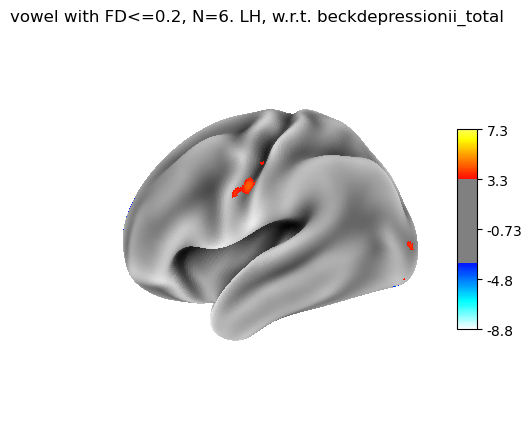

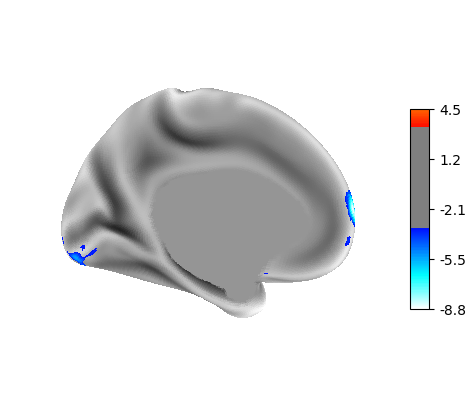

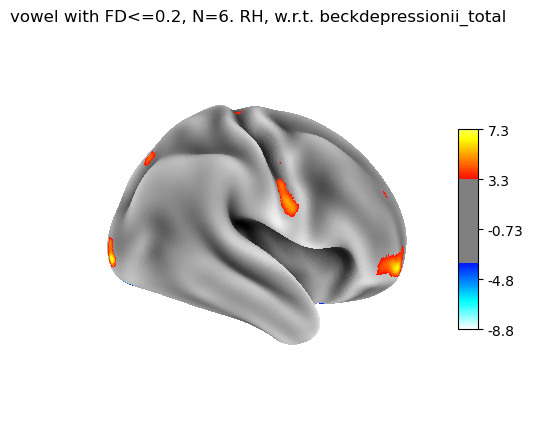

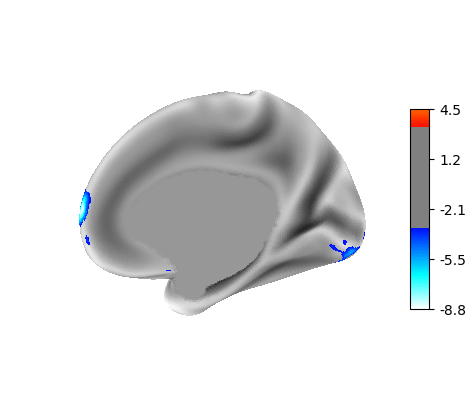

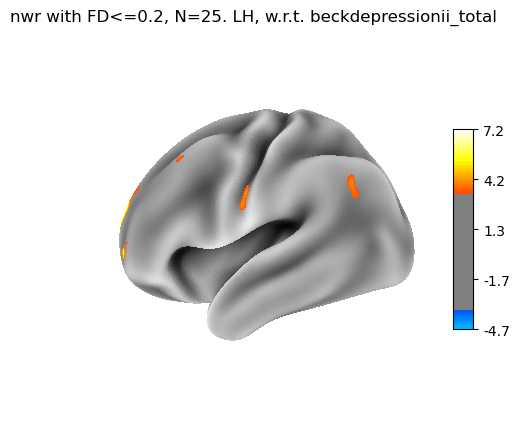

...

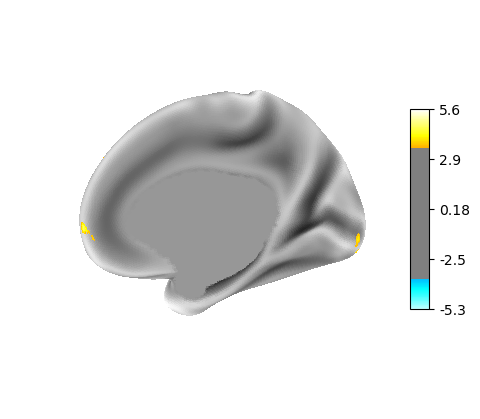

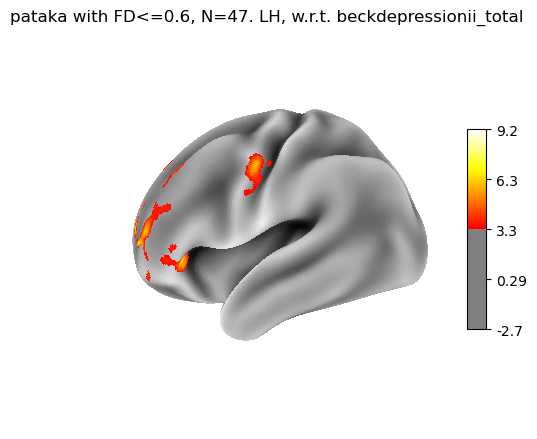

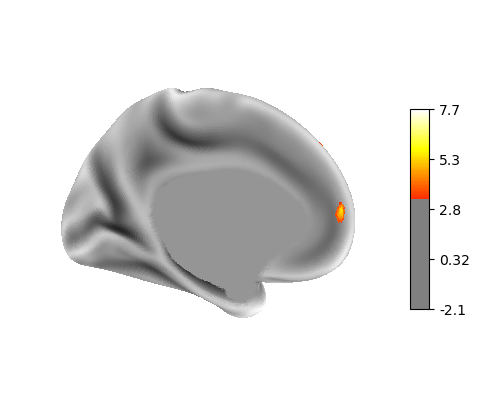

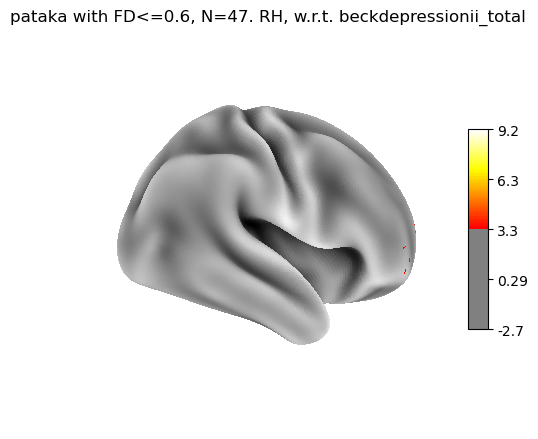

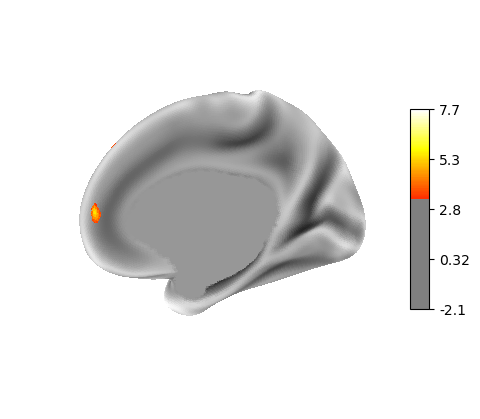

In [23]:
## plot z-scored betas threholded per task/fd w.r.t. a covariate

covariate = 'beckdepressionii_total'

for fd,task_data in dict_second_level_betas.items():
    for task, betas in task_data.items():
        betas = dict_second_level_betas[fd][task]
        betas_z = betas.apply(stats.zscore)
        thresholds = betas_z.apply(lambda z: fdr_threshold(z,alpha=0.05))
        
        n_sub = len(second_level_df[fd][task])

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated, hcp.cortex_data(betas_z[covariate]), hemi='left', threshold=thresholds[covariate],
            symmetric_cbar = False,
            colorbar=True,
            title = f'{task} with FD<={fd}, N={n_sub}. LH, w.r.t. {covariate}',
            title_font_size=30,#vmax = vmax,
            bg_map=hcp.mesh.sulc)

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated_left, hcp.left_cortex_data(betas_z[covariate]), view= 'lateral',
            hemi='right', threshold=thresholds[covariate],
            symmetric_cbar = False,
            colorbar=True,#vmax = vmax,
            bg_map=hcp.mesh.sulc_left)

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated, hcp.cortex_data(betas_z[covariate]), hemi='right', threshold=thresholds[covariate],
            symmetric_cbar = False,
            colorbar=True,
            title = f'{task} with FD<={fd}, N={n_sub}. RH, w.r.t. {covariate}',#vmax = vmax,
            bg_map=hcp.mesh.sulc)

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated_right, hcp.left_cortex_data(betas_z[covariate]), view= 'lateral',
            hemi='left', threshold=thresholds[covariate],
            symmetric_cbar = False,
            colorbar=True,#vmax = vmax,
            bg_map=hcp.mesh.sulc_right)

        nplot.show()


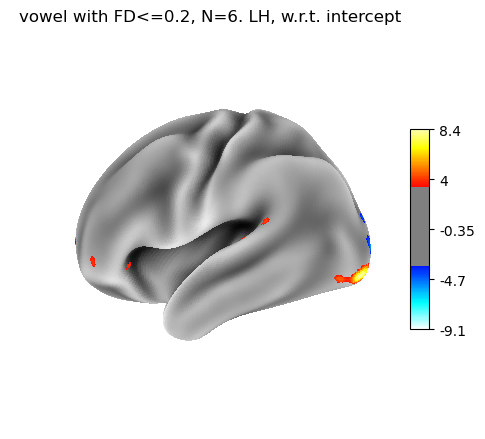

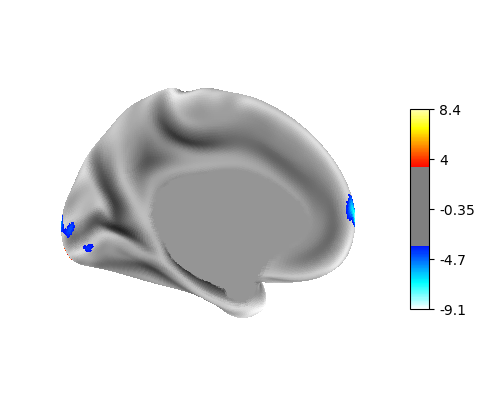

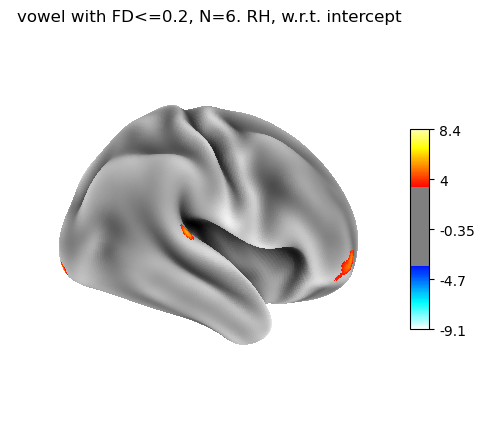

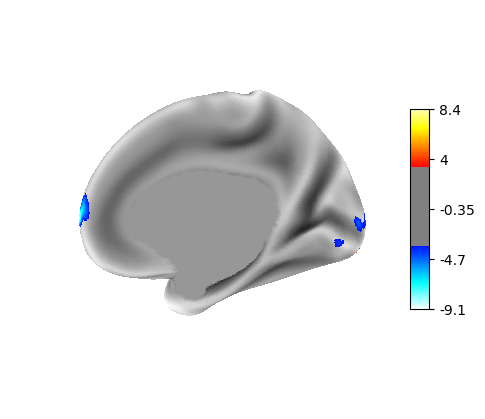

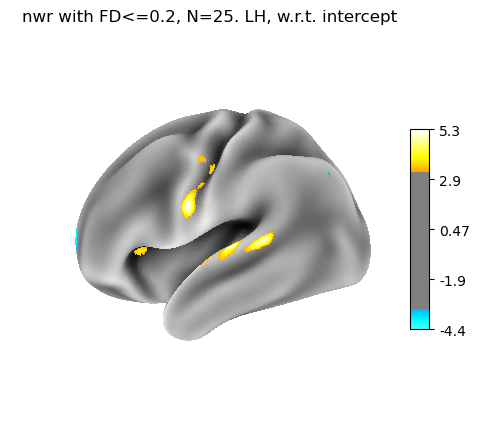

...

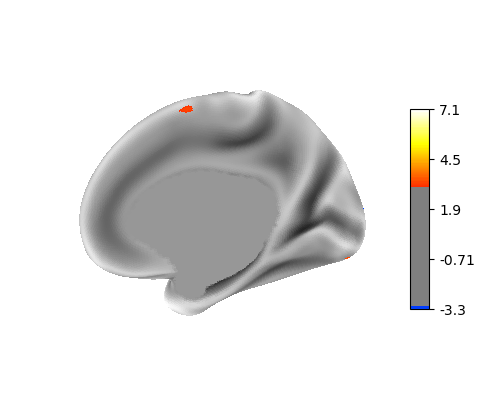

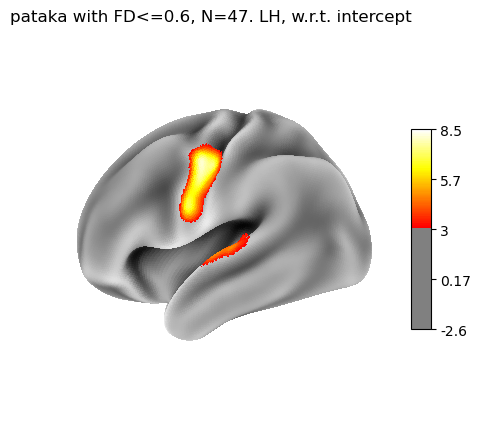

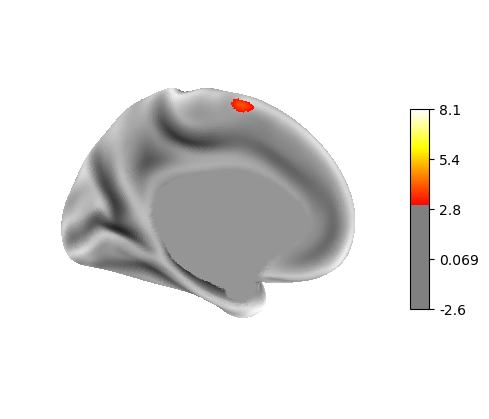

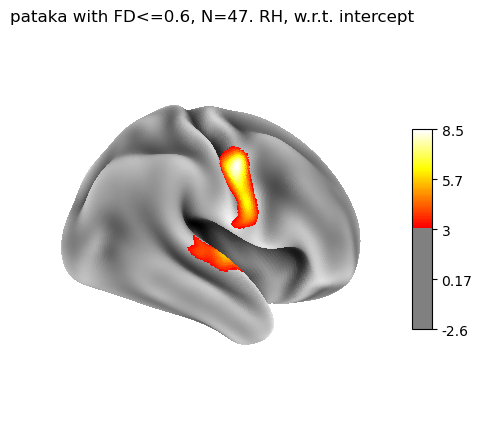

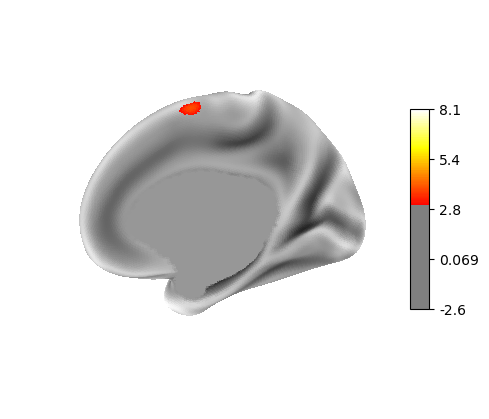

In [10]:
## plot z-scored betas threholded per task/fd w.r.t. a covariate

covariate = 'intercept'

for fd,task_data in dict_second_level_betas.items():
    for task, betas in task_data.items():
        betas = dict_second_level_betas[fd][task]
        betas_z = betas.apply(stats.zscore)
        thresholds = betas_z.apply(lambda z: fdr_threshold(z,alpha=0.05))
        
        n_sub = len(second_level_df[fd][task])

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated, hcp.cortex_data(betas_z[covariate]), hemi='left', threshold=thresholds[covariate],
            symmetric_cbar = False,
            colorbar=True,
            title = f'{task} with FD<={fd}, N={n_sub}. LH, w.r.t. {covariate}',
            title_font_size=30,#vmax = vmax,
            bg_map=hcp.mesh.sulc)

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated_left, hcp.left_cortex_data(betas_z[covariate]), view= 'lateral',
            hemi='right', threshold=thresholds[covariate],
            symmetric_cbar = False,
            colorbar=True,#vmax = vmax,
            bg_map=hcp.mesh.sulc_left)

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated, hcp.cortex_data(betas_z[covariate]), hemi='right', threshold=thresholds[covariate],
            symmetric_cbar = False,
            colorbar=True,
            title = f'{task} with FD<={fd}, N={n_sub}. RH, w.r.t. {covariate}',#vmax = vmax,
            bg_map=hcp.mesh.sulc)

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated_right, hcp.left_cortex_data(betas_z[covariate]), view= 'lateral',
            hemi='left', threshold=thresholds[covariate],
            symmetric_cbar = False,
            colorbar=True,#vmax = vmax,
            bg_map=hcp.mesh.sulc_right)

        nplot.show()


In [11]:
#subcortical plotting (probably)
#using this example from Chris, I reformed the cifti to volumetric form and ploted subcortical regions
#https://nbviewer.org/github/neurohackademy/nh2020-curriculum/blob/master/we-nibabel-markiewicz/NiBabel.ipynb

def volume_from_cifti(data, axis):
    assert isinstance(axis, nib.cifti2.BrainModelAxis)
    data = data.T[axis.volume_mask]                          # Assume brainmodels axis is last, move it to front
    volmask = axis.volume_mask                               # Which indices on this axis are for voxels?
    vox_indices = tuple(axis.voxel[axis.volume_mask].T)      # ([x0, x1, ...], [y0, ...], [z0, ...])
    vol_data = np.zeros(axis.volume_shape + data.shape[1:],  # Volume + any extra dimensions
                        dtype=data.dtype)
    vol_data[vox_indices] = data                             # "Fancy indexing"
    return nib.Nifti1Image(vol_data, axis.affine)             # Add affine for spatial interpretation

'../../derivatives/first_level/speech_v_silence_effects_size/sub-voice893_ses-1_task-vowel_run-1_fsLR_91k_speechvssilence_effect_size.dscalar.nii'

In [19]:
cifti = nib.load(second_level_effects[0.2]['vowel'][0])
cifti_data = cifti.get_fdata(dtype=np.float32)
axes = [cifti_hdr.get_axis(i) for i in range(cifti.ndim)]


NameError: name 'cifti_hdr' is not defined

In [ ]:
##plot on the subcortical too

obj = volume_from_cifti(z_second_level_betas, axes[1])#.orthoview()
template = '../../derivatives/templates/tpl-MNI152NLin6Asym_res-02_T1w.nii.gz'

coord = [-27, -4, -20]
nplot.plot_stat_map(obj, bg_img=template,cut_coords=coord,
                    display_mode='ortho', #threshold=-threshold,
                    black_bg=True,
                    title=f'unthresholded, subcortical random effects (z-scored) for pataka')


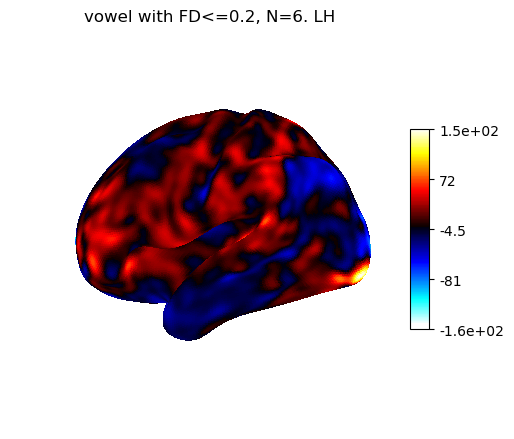

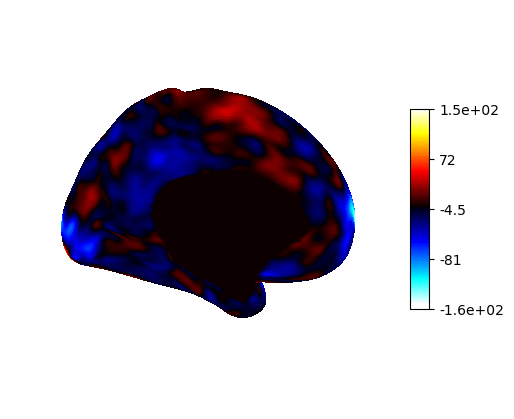

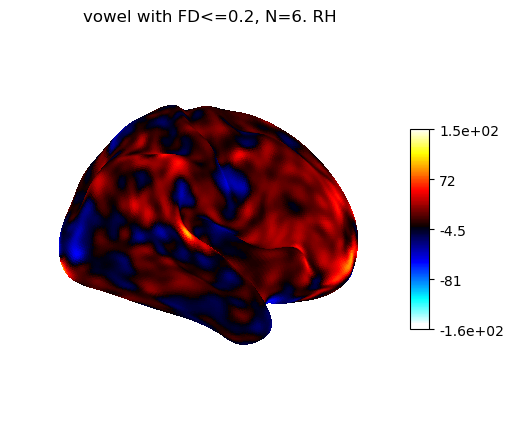

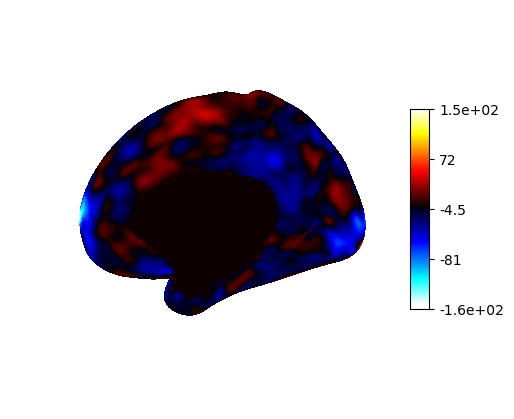

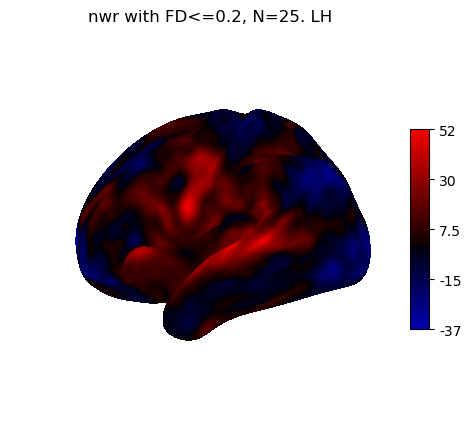

...

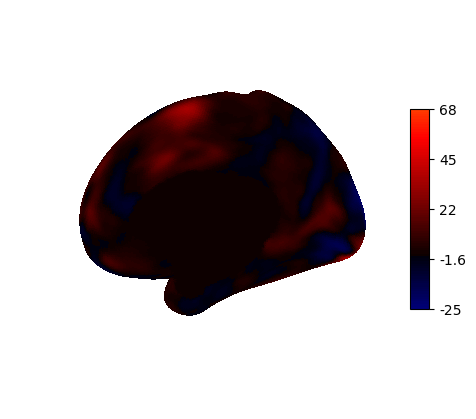

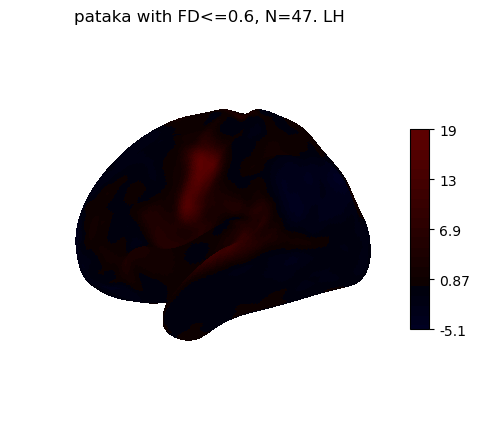

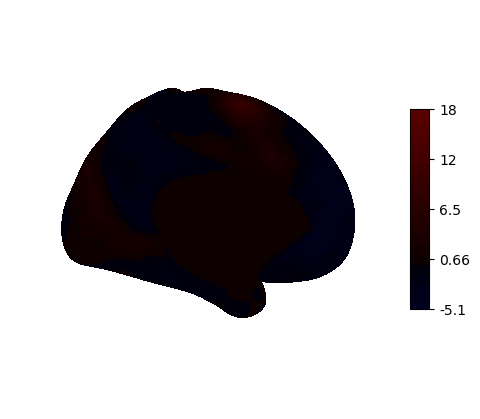

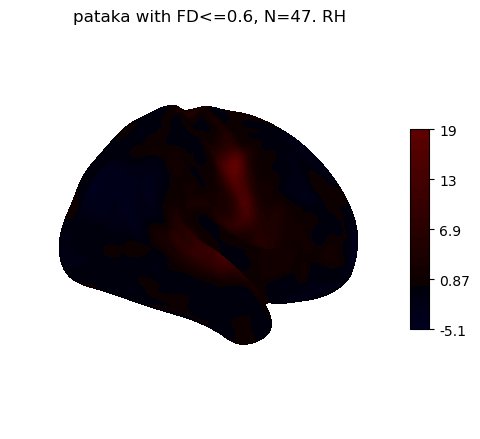

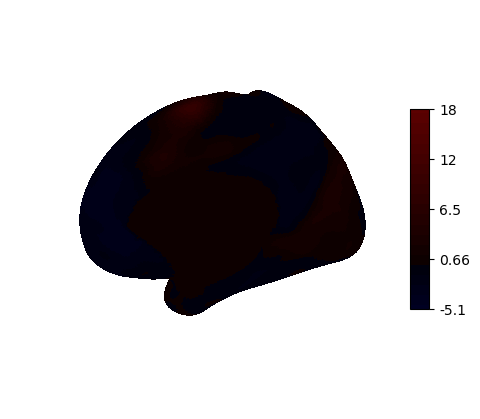

In [80]:

# covariate = 'intercept'
# vmax = 150

# for fd,task_data in dict_second_level_betas.items():
#     for task, betas in task_data.items():
#         n_sub = len(second_level_df[fd][task])

#         nplot.plot_surf_stat_map(
#             hcp.mesh.inflated, hcp.cortex_data(betas[covariate]), hemi='left', threshold=thresholds[covariate],
#             symmetric_cbar = False,
#             colorbar=True,
#             title = f'{task} with FD<={fd}, N={n_sub}. LH',
#             title_font_size=30,
#             vmax = vmax,
#             bg_map=hcp.mesh.sulc)

#         nplot.plot_surf_stat_map(
#             hcp.mesh.inflated_left, hcp.left_cortex_data(betas[covariate]), view= 'lateral',
#             hemi='right', threshold=thresholds[covariate],
#             symmetric_cbar = False,
#             colorbar=True,
#             vmax = vmax,
#             bg_map=hcp.mesh.sulc_left)

#         nplot.plot_surf_stat_map(
#             hcp.mesh.inflated, hcp.cortex_data(betas[covariate]), hemi='right', threshold=thresholds[covariate],
#             symmetric_cbar = False,
#             colorbar=True,
#             title = f'{task} with FD<={fd}, N={n_sub}. RH',
#             vmax = vmax,
#             bg_map=hcp.mesh.sulc)

#         nplot.plot_surf_stat_map(
#             hcp.mesh.inflated_right, hcp.left_cortex_data(betas[covariate]), view= 'lateral',
#             hemi='left', #threshold=3.5,
#             symmetric_cbar = False,
#             colorbar=True,
#             vmax = vmax,
#             bg_map=hcp.mesh.sulc_right)

#         nplot.show()


In [60]:
def generate_zscore_cifti_object(thresholded_pool,file_name,sample_cifti_file='../../derivatives/fmriprep/sub-voice857/ses-1/smoothed/sub-voice857_ses-1_task-pataka_run-1_space-fsLR_den-91k_bold.dtseries.nii'):
    #takes 91k np array of parcels and generates cifti object
    
    sample_cifti = nimg.load_img(sample_cifti_file)
    time_axis, brain_model_axis = [sample_cifti.header.get_axis(i) for i in range(sample_cifti.ndim)]
    z = np.atleast_2d(thresholded_pool)
    scalar_axis = nib.cifti2.ScalarAxis(['fixed_effects'])  # Takes a list of names, one per row
    new_header = nib.Cifti2Header.from_axes([scalar_axis, brain_model_axis])
    #z = np.reshape(z, (-1, z.shape[0]))
    img = nib.Cifti2Image(z, new_header)
    
#     name = f'{task}_thresholded_pool.dtseries.nii'
    name = file_name
    img.to_filename(name)
    return name

In [70]:
#visualizing in the 3d rotating view
nplot.view_surf(hcp.mesh.inflated, hcp.cortex_data(z_second_level_betas), bg_map=hcp.mesh.sulc, threshold=threshold)

In [5]:
cifti = nib.load(fixed_effects_all[0])
cifti_data = cifti.get_fdata(dtype=np.float32)
cifti_hdr = cifti.header

In [6]:
axes = [cifti_hdr.get_axis(i) for i in range(cifti.ndim)]
axes

In [48]:
a = axes[1]
d = z_second_level_betas

In [65]:
print(cifti.header)

In [61]:
print(a.)

TypeError: BrainModelAxis.to_mapping() missing 1 required positional argument: 'dim'

In [50]:
np.zeros(a.volume_shape + d.shape[1:],  # Volume + any extra dimensions
                        dtype=d.dtype).shape

(91, 109, 91)

In [33]:
axes[1].

array([[-1, -1, -1],
       [-1, -1, -1],
       [-1, -1, -1],
       ...,
       [45, 56, 38],
       [45, 56, 40],
       [45, 56, 41]])

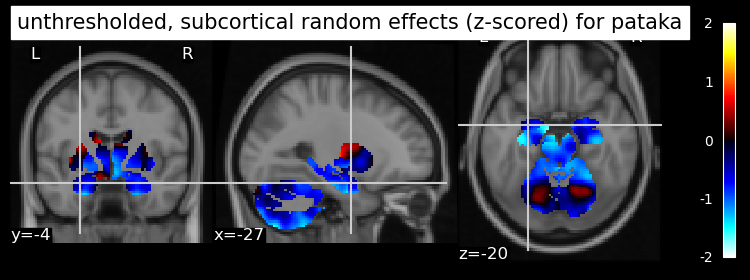

In [18]:
obj = volume_from_cifti(z_second_level_betas, axes[1])#.orthoview()
template = '../../derivatives/templates/tpl-MNI152NLin6Asym_res-02_T1w.nii.gz'

coord = [-27, -4, -20]
nplot.plot_stat_map(obj, bg_img=template,cut_coords=coord,
                    display_mode='ortho', #threshold=-threshold,
                    black_bg=True,
                    title=f'unthresholded, subcortical random effects (z-scored) for pataka')

In [ ]:
# def generate_zscore_cifti_object(thresholded_pool, task,sample_cifti_file='../../derivatives/fmriprep/sub-voice857/ses-1/smoothed/sub-voice857_ses-1_task-pataka_run-1_space-fsLR_den-91k_bold.dtseries.nii'):
#     #takes 91k np array of parcels and generates cifti object
    
#     sample_cifti = nimg.load_img(sample_cifti_file)
#     time_axis, brain_model_axis = [sample_cifti.header.get_axis(i) for i in range(sample_cifti.ndim)]
#     z = np.atleast_2d(thresholded_pool)
#     scalar_axis = nib.cifti2.ScalarAxis(['zscore'])  # Takes a list of names, one per row
#     new_header = nib.Cifti2Header.from_axes([scalar_axis, brain_model_axis])
#     #z = np.reshape(z, (-1, z.shape[0]))
#     img = nib.Cifti2Image(z, new_header)
    
# #     name = f'{task}_thresholded_pool.dtseries.nii'
#     name = f'{task}_thresholded_pool.dscalar.nii'
#     img.to_filename(name)
#     return name